<a href="https://colab.research.google.com/github/ErickCarlis/PROJETO_1_ANALISE_DE_DADOS_AIR_BNB_LONDON/blob/main/PROJETO_1_ANALISE_DE_DADOS_AIR_BNB_LONDON.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Projeto 1 - Análise de Dados - AirBnB - Londres**

**Airbnb** é uma empresa americana de locação de imóveis e acomodações, que opera on-line com locações de curto e longo prazo. Iniciada com a locação de um colchão de ar numa sala, se transformou em uma espécie de pousada em 2007, sendo hoje considerado uma das maiores empresas hoteleiras do mundo, sem possuir nenhum hotel próprio. Em 2020 a empresa valia cerca de U$ 18 bilhões, e em 2023 contava com pouco mais de 6000 funcionários.


Este projeto sobre o **Airbnb**, traz **dados de locações** de uma das principais cidades do mundo, obtidos no portal **[Inside Airbnb](https://insideairbnb.com/get-the-data/)**. Aqui vamos analisar os dados de locações da cidade de **Londres**, na Inglaterra.

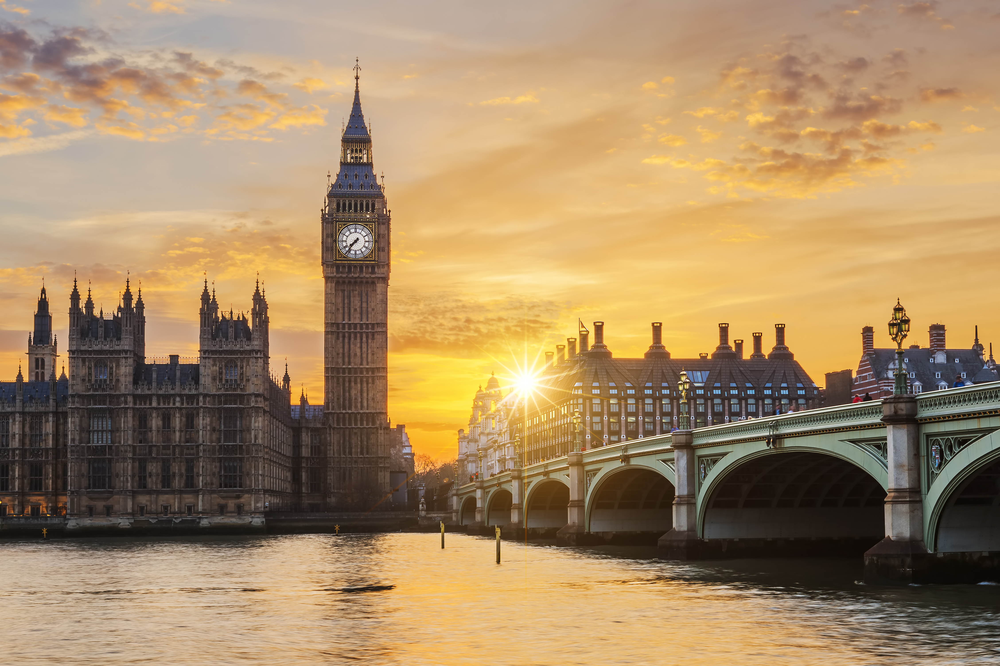

Quando se pensa na **questão turística** vale a pena destacar os principais pontos:

-  Passeio de barco pelo **Rio Tâmisa** (passando pela Houses of Parliament e London Eye) e visita à **Torre de Londres**;
- Visita ao **Kew Gardens** (um dos maiores jardins botânicos do mundo) e ao **Zoológico de Londres**;
-  Passeio de ônibus panorâmico por Londres (passando por **Piccadilly Circus**, **Trafalgar Square** e **Buckingham Palace**);
-  Passeio gastronômico por **Borough Market** e visita à **Tate Modern**;
-  Passeio de ônibus de dois andares pelos bairros de **Notting Hill** e **Camden Town**;

Vamos iniciar nosso projeto **importando** as bibliotecas necessárias para a **análise exploratória dos dados**.

In [2]:
# Importando as bibliotecas

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = "svg"
plt.rcParams["font.family"] = "sans-serif"

**Acessando** a base de dados:
- Aqui vamos estudar as principais informações da base de dados.

In [3]:
# Acessando a base de dados

df = pd.read_csv("https://raw.githubusercontent.com/ErickCarlis/dados_do_projeto_airbnb_londres/refs/heads/main/listings.csv")

In [4]:
# Verificando a quantidade de linhas e colunas

df.shape

(96182, 18)

In [5]:
# Verificando os nomes das colunas

df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [6]:
#Verificando os tipos de dados das colunas

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96182 entries, 0 to 96181
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              96182 non-null  int64  
 1   name                            96182 non-null  object 
 2   host_id                         96182 non-null  int64  
 3   host_name                       96177 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   96182 non-null  object 
 6   latitude                        96182 non-null  float64
 7   longitude                       96182 non-null  float64
 8   room_type                       96182 non-null  object 
 9   price                           63205 non-null  float64
 10  minimum_nights                  96182 non-null  int64  
 11  number_of_reviews               96182 non-null  int64  
 12  last_review                     

**Significado** de cada coluna:

-  id - número de id gerado cuja finalidade é identificar o imóvel;
-  name - nome da propriedade anunciada;
-  host_id - número de id do proprietário (anfitrião) da propriedade;
-  host_name - nome do anfitrião;
-  neighbourhood_group - esta coluna não possui valor válido;
-  neighbourhood - nome do bairro;
-  latitude - coordenada da latitude do imóvel;
-  longitude - coordenada da longitude do imóvel;
-  room_type - informação sobre o tipo de quarto que é ofertado;
-  price - preço para alugar o imóvel;
-  minimum_nights - período mínimo de noites por reserva;
-  number_of_reviews - número de reviews que o imóvel possui;
-  last_review - data do último review;
-  reviews_per_month - quantidade de reviews por mês;
-  calculated_host_listings_count - quantidade de imóveis do mesmo anfitrião;
-  availability_365 - número de dias disponíveis em 365 dias.

In [7]:
# Visualizando as primeiras linhas da base de dados

df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,116268,Double Room (Unavailable for check in 31Dec-1Jan),586671,Joe,NaN,Enfield,51.611370,-0.118880,Private room,40.0,7,38,2024-01-01,0.28,1,105,1,NaN
1,117203,A stylish Victorian home in West London,255103,Olga,NaN,Hammersmith and Fulham,51.501550,-0.233002,Entire home/apt,131.0,5,91,2024-06-09,0.59,1,33,10,NaN
2,127652,Contemporary central London apt,134938,Ron,NaN,Camden,51.559528,-0.144319,Entire home/apt,215.0,5,216,2024-07-09,1.35,1,134,5,NaN
3,127860,Double bedroom in cottage Twickenham (sleeps 1-2),161720,Andy,NaN,Richmond upon Thames,51.447770,-0.339620,Private room,NaN,2,0,NaN,NaN,1,0,0,NaN
4,131444,Apartment close to centre.,646165,Yevgeniy,NaN,Lambeth,51.491476,-0.111514,Entire home/apt,150.0,30,148,2024-06-15,0.93,2,6,12,NaN


Identificando **valores NaN (nulos ou ausentes)**:
- A verificação de valores **nulos** é imprescindível para compreensão de sua existência, assim como sua correção, para evitar os possíveis erros na análise.

In [8]:
# Verificando a existência de valores NaN (nulos / ausentes)

df.isnull().sum()

,0
id,0
name,0
host_id,0
host_name,5
neighbourhood_group,96182
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,32977


Todos os valores da coluna **neighbourhood_group ** estão **ausentes**, ou seja, **100%** de valores **nulos**. Então iremos **excluí-la**. O mesmo faremos com as **linhas** com **dados ausentes** da coluna **license**. As colunas que também apresentam **ausências** - (availability_365, host_name e number_of_reviews) - precisarão de mais compreensão sobre quais perguntas deveremos responder sobre o negócio. Portanto, caberia bem mais **investigação e análise**.

Excluindo a coluna **neighbourhood_group**:
 - Utilizando o método **drop** para apagar a coluna.

In [9]:
# Excluindo a coluna neighbourhood_group com o método drop

df.drop("neighbourhood_group", axis = 1, inplace = True)

Excluindo os valores **NaN**:
 - Utilizando o método **dropna** para apagar as linhas com **valores ausentes** da coluna **price**.

In [10]:
# Excluindo as linhas com valores nan pela coluna price (onde não há preços), com o método dropna

df.dropna(subset = ["id"], inplace = True)

**Resumo estatístico**:

- Depois de apagar as colunas com ausencia de dados, verificaremos o **resumo estatístico** para entender um pouco sobre os **valores**. Utilizando o método **describe**.

In [11]:
#Verificando o resumo estatístico das colunas com valores numéricos

df[["price", "minimum_nights", "number_of_reviews", "reviews_per_month",
    "calculated_host_listings_count", "availability_365"]].describe().round()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,63205.0,96182.0,96182.0,71649.0,96182.0,96182.0
mean,197.0,5.0,20.0,1.0,15.0,132.0
std,840.0,23.0,47.0,1.0,50.0,134.0
min,1.0,1.0,0.0,0.0,1.0,0.0
25%,76.0,1.0,0.0,0.0,1.0,0.0
50%,130.0,2.0,4.0,1.0,2.0,88.0
75%,211.0,4.0,18.0,1.0,7.0,263.0
max,80000.0,1125.0,1682.0,42.0,438.0,365.0


Analisando o **resumo estatístico** dos dados do Airbnb em Londres, observamos que a mediana de noites mínimas para aluguel é de **2 dias**, ou seja, **50%** das propriedades exigem estadias de até **2 noites**. Adicionalmente, **75%** das acomodações permitem reservas de no máximo **3 noites**, indicando uma preferência por estadias curtas. Essa característica pode estar relacionada à grande quantidade de turistas que visitam a cidade.

Quanto ao **preço**, a mediana é de **130 libras**, sugerindo que este é um valor comum para uma diária em **Londres**. No entanto, a presença de valores máximos muito elevados indica a existência de propriedades de luxo ou acomodações para estadias mais longas. Para uma análise mais detalhada do comportamento dos preços, será fundamental realizar **visualizações gráficas**.

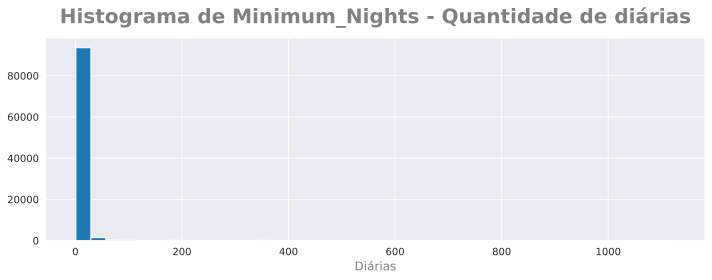

In [12]:
#Plotando histograma da coluna "minimum_nights"

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize=(10, 4), dpi=150)
ax.hist("minimum_nights", data=df, bins=40)

ax.set_title("Histograma de Minimum_Nights - Quantidade de diárias", color="grey", fontsize=20, fontweight="semibold", pad=15)

ax.set_ylabel("")
ax.set_xlabel("Diárias", color="grey", fontsize=12)
plt.tight_layout()

O gráfico de **histograma** acima mostra uma grande concentração da quantidades de locações muito **abaixo de 100** diárias. Ou seja, visualmente mais perto das **30 diárias**, confirmando os dados do **Resumo estatístico**. Outra possibilidade de **visualização** sobre a distribuição dos dados é o gráfico **boxplot**.

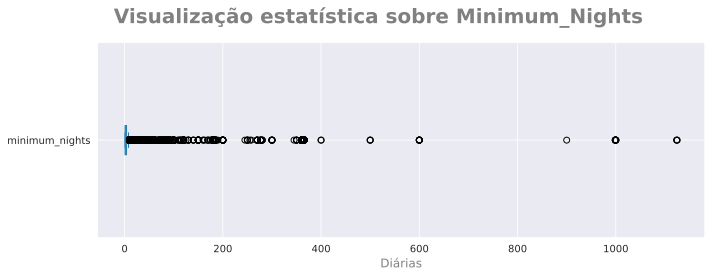

In [13]:
# Plotando o boxplot da coluna "minimum_nights"

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize = (10,4), dpi = 150)
df.minimum_nights.plot(kind = "box", vert = False, ax = ax)
ax.text(-22, 1.6, "Visualização estatística sobre Minimum_Nights", color = "grey", fontsize = 20, fontweight = "bold")
ax.set_ylabel("")
ax.set_xlabel("Diárias", color = "grey", fontsize = 12)
plt.tight_layout()


Podemos notar que o gráfico **boxplot** acima deixou os dados bem confusos sobre a quantidade de noites da coluna **minimum_nights**, apesar de podemos ver que está concentrada nos primeiros valores, surgiram muitos **outliers**, que são valores discrepantes do padrão.

Para melhorarmos nossa **análise exploratória**, uma boa prática é gerarmos uma **cópia** da base de dados para nossos **tratamentos** necessários.

In [14]:
#Quantidade de locações por período de locação até 30 dias:

print(f"Quantidade total de locações até 30 dias pela coluna minimum_nights: {(len(df[df.minimum_nights <= 30]))}.")
print("Percentual de correspondência da base de dados: {:.2f}%.".format((len(df[df.minimum_nights <= 30]) / df.shape[0])*100))

Quantidade total de locações até 30 dias pela coluna minimum_nights: 94812.
Percentual de correspondência da base de dados: 98.58%.


In [15]:
# Gerando uma cópia da base de dados

df_copia = df.copy()

Agora podemos apagar os valores **outliers** da coluna **minimum_nights**, que são superiores a **30 diárias**. Então vamos visualizar a **distribuição** desta nova base de dados.

In [16]:
# Removendo os valores "outliers" da coluna minimum_nights

df_copia.drop(df_copia[df_copia.minimum_nights > 30].index, axis = 0, inplace = True)

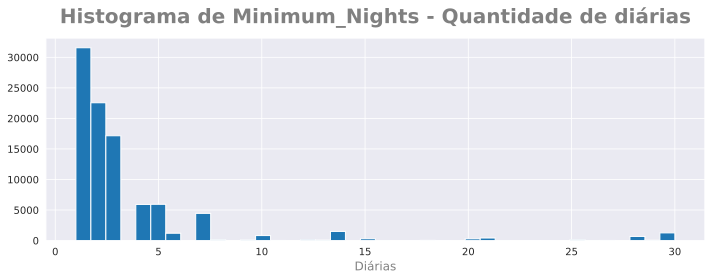

In [17]:
# Plotando um histograma da coluna "minimum_nights" sem "outliers"

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize = (10,4), dpi = 150)
sns.set_style()
ax.hist("minimum_nights", data = df_copia, bins = 40)
ax.set_title("Histograma de Minimum_Nights - Quantidade de diárias", color="grey", fontsize=20, fontweight="semibold", pad=15)

ax.set_ylabel("")
ax.set_xlabel("Diárias", color="grey", fontsize=12)
plt.tight_layout()

Percebemos aqui que existem **2 grupos** de locatários. Um que normalmente realiza locações até perto de **10 dias**, outro grupo que realiza locações por cerca de **30** dias. Vamos separar os dois grupos em nossa base de dados. As bases serão **df_7** e **df_30**.

In [18]:
# Separando a base de dados

df_7 = df_copia.loc[df_copia.minimum_nights <= 7]
df_30 = df_copia.loc[df_copia.minimum_nights > 7]

Agora vamos visualizar os dados estatísticos com o **boxplot** para os dois grupos.

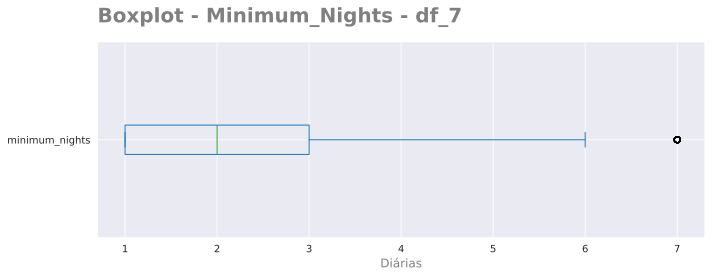

In [19]:
# Boxplot da coluna "minimum_nights" para a base df_7

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize = (10,4), dpi = 150)
df_7.minimum_nights.plot(kind = "box", vert = False, ax = ax)
ax.text(0.7, 1.6, "Boxplot - Minimum_Nights - df_7", color = "grey", fontsize = 20, fontweight = "semibold")
ax.set_ylabel("")
ax.set_xlabel("Diárias", color = "grey", fontsize = 12)
plt.tight_layout()

Agora podemos notar claramente que a grande maioria das locações deste grupo ocorre nos **3 primeiros dias**, inclusive, sendo este o valor da **mediana** no **boxplot**.

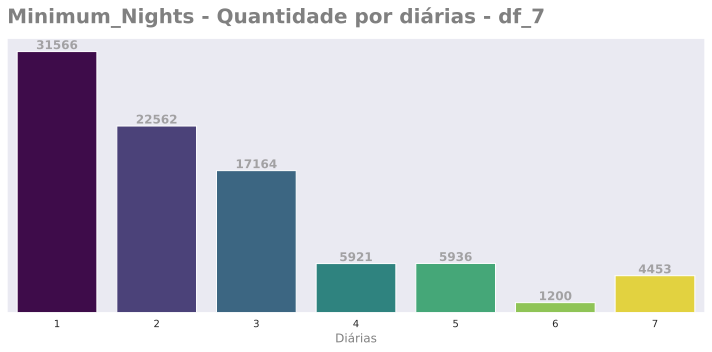

In [20]:
# Countplot com a contagem por dia

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize = (10, 5), dpi = 150)
sns.set_style()
barras = sns.countplot(x = "minimum_nights", data = df_7, ax = ax, palette = "viridis",
                       hue = "minimum_nights", legend = False)

for i in barras.patches:
  ax.annotate(int(i.get_height()),
              xy = (i.get_x() + i.get_width() / 2,
                    i.get_height()),
              color = "#A2A1A3",
              fontweight = "semibold",
              ha = "center",
              va = "bottom", fontsize = 12)

plt.gca().axes.get_yaxis().set_visible(False)
ax.text(-0.5, 35000, "Minimum_Nights - Quantidade por diárias - df_7", color = "grey", fontsize = 20, fontweight = "semibold")
ax.set_xlabel("Diárias", color = "grey", fontsize = 12)
ax.set_ylabel("")
plt.tight_layout()

Os dois gráficos acima mostram que a grande maioria das locações deste grupo ocorre nos **3 primeiros dias**.
Agora verificamos como estão as principais **informações, distribuições e valores** por **bairros** de ambas as bases. Começaremos pela base **df_7**.

In [21]:
# Verificando os nomes dos bairros da base df_7 com o método unique

df_7.neighbourhood.unique()

array(['Enfield', 'Hammersmith and Fulham', 'Camden',
       'Richmond upon Thames', 'City of London', 'Hackney', 'Merton',
       'Ealing', 'Haringey', 'Westminster', 'Lambeth',
       'Kensington and Chelsea', 'Southwark', 'Tower Hamlets', 'Brent',
       'Islington', 'Barking and Dagenham', 'Croydon', 'Lewisham',
       'Wandsworth', 'Barnet', 'Hounslow', 'Waltham Forest', 'Havering',
       'Greenwich', 'Hillingdon', 'Newham', 'Redbridge', 'Bexley',
       'Kingston upon Thames', 'Bromley', 'Harrow', 'Sutton'],
      dtype=object)

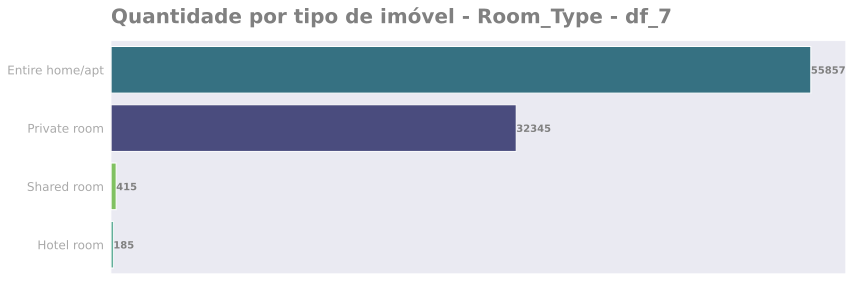

In [22]:
# Verificando a quantidade de tipo de imóvel para locação na base df_7

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize=(12, 4), dpi = 150)

barras = sns.countplot(y = "room_type", data = df_7, ax = ax, orient = "h", palette="viridis", order = df_7.room_type.value_counts().index,
                       hue = "room_type", legend = False)

for i in barras.patches:
  ax.annotate(int(i.get_width()),
              xy = (((i.get_width() + 5) - (i.get_height())),
                     i.get_x() + i.get_y() + (i.get_height() / 2)),
                     va = "center_baseline", color = "grey", fontweight = "bold",
                     ha = "left", fontsize = 10)

plt.gca().axes.get_xaxis().set_visible(False)
ax.text(0.7, -0.8, "Quantidade por tipo de imóvel - Room_Type - df_7", color = "grey", fontsize = 20, fontweight = "semibold")
ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis = "y", labelsize = 12, colors = "darkgrey")
plt.tight_layout()

A maior quantidade de locações o grupo **df_7** está entre **apartamento ou casa individuais (Entire home/apt)** e **quartos individuais (Private room)**. Hotel completo e **quarto compartilhado** tem locações mínimas na cidade de **Londres**.

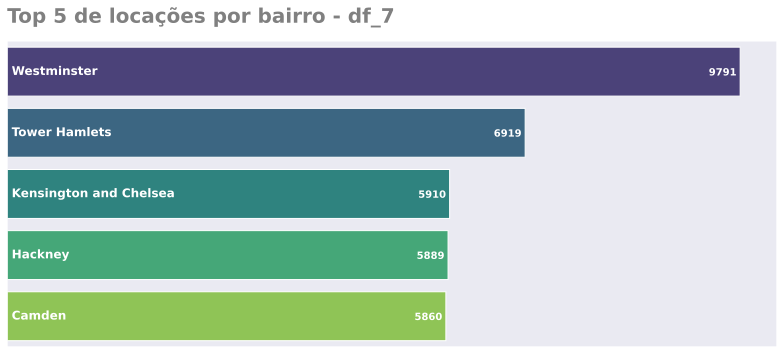

In [23]:
# Plotando a quantidade de locações por bairros

imoveis = df_7.groupby(["neighbourhood"]).size().sort_values(ascending = False)[:5]
imoveis = pd.DataFrame(imoveis, columns = ["values"])
imoveis.reset_index(inplace = True)

fig, ax = plt.subplots(figsize=(11, 5), dpi = 150)
sns.set_style()

palette = "viridis"

barras = sns.barplot(x = "values", y = "neighbourhood", data = imoveis, ax = ax, palette=palette,
                     hue = "neighbourhood", legend = False)

for i in barras.patches:
    ax.annotate(int(i.get_width()),
                xy = ((i.get_width() - (i.get_height() * 60)),
                       i.get_x() + i.get_y() + (i.get_height() / 2)),
                       va = "center_baseline", color = "white", fontweight = "bold",
                       ha = "right")

for i in range(len(imoveis)):
    bairro = imoveis.iloc[i, 0]
    valor = imoveis.iloc[i, 1]
    ax.text(valor - valor + 60, i, bairro, fontsize = 12, fontweight = "bold", color = "white", va = "center")

plt.gca().axes.get_xaxis().set_visible(False)
plt.gca().axes.get_yaxis().set_visible(False)
ax.text(0., -0.8, "Top 5 de locações por bairro - df_7", fontsize = 20, color = "grey", fontweight = "bold")

ax.set_xlabel("")
ax.set_ylabel("")
plt.tight_layout()

Localizado na **Zona 1**, a mais central de Londres, **Westminster** oferece excelente acesso ao transporte público. É cercado pelas **zonas 2 e 3**, e possui diversas estações de metrô **(Circle, District, Jubilee, Victoria e Northern lines)**, além de várias linhas de ônibus.
Embora seja uma área urbana, a **rodovia A4** passa não muito longe, conectando a região a **Heathrow** e ao oeste de Londres.
Pontos de referência: **Big Ben, Palácio de Buckingham, Abadia de Westminster**.

Também situado nas **Zonas 1 e 2**, **Kensington and Chelsea** é bem servido por transporte público. As linhas de metrô **District e Circle** atendem a região, assim como diversas linhas de ônibus.
A **rodovia A4** também passa por **Kensington and Chelsea**, conectando-a a outras partes de Londres e a **Heathrow**.
Região: Oeste de Londres. Pontos de referência: **Hyde Park, Kensington Palace, Harrods**.

**Outras considerações:**

**Vizinhança:** Ambos os bairros são vizinhos de outras áreas populares como **Mayfair, Chelsea, e Belgravia,** que também podem apresentar alta demanda por hospedagem.
**Atrações:** A proximidade a diversas atrações turísticas, como museus, parques e áreas comerciais, impulsiona a procura por hospedagem nessas regiões.
**Preço:** Devido à sua localização central e infraestrutura, os preços das propriedades em Westminster e Kensington and Chelsea costumam ser mais elevados

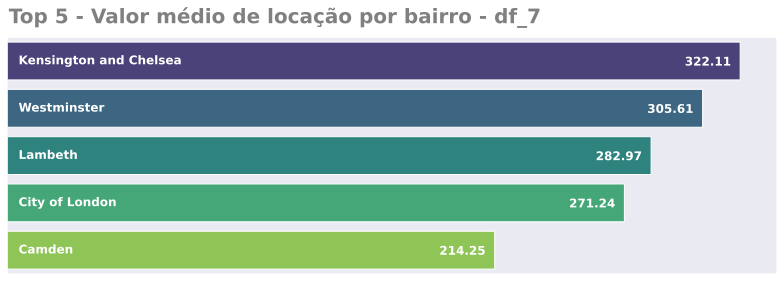

In [24]:
# Visualizando a "média" de preços por bairros ordenando pelo maior valor

price_mean = round(df_7.groupby(["neighbourhood"]).price.mean().sort_values(ascending = False)[:5], 2)
price_mean = pd.DataFrame(price_mean)
price_mean.reset_index(inplace = True)
sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize=(11, 4), dpi = 150)

palette = "viridis"

barras = sns.barplot(x = "price", y = "neighbourhood", data = price_mean, ax = ax, palette=palette,
                     hue = "neighbourhood", legend = False)

for i in barras.patches:
    ax.annotate(i.get_width(),
                xy = ((i.get_width() - (i.get_height() * 5)),
                       i.get_x() + i.get_y() + (i.get_height() / 2)),
                       va = "center_baseline", color = "white", fontweight = "bold",
                       ha = "right", fontsize = 12)

for i in range(len(price_mean)):
    bairro = price_mean.iloc[i, 0]
    valor = price_mean.iloc[i, 1]
    ax.text(valor - valor + 5, i, bairro, fontsize = 12, fontweight = "bold", color = "white", va = "center")

plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)
ax.text(0.7, -0.8, "Top 5 - Valor médio de locação por bairro - df_7", fontsize = 20, color = "grey", fontweight = "bold")
ax.set_xlabel("")
ax.set_ylabel("")
plt.tight_layout()

Os cinco bairros com as maiores médias de locação estão todos localizados em áreas centrais de Londres, confirmando a relação direta entre localização e valor do aluguel.

A presença de pontos turísticos icônicos, como o **Palácio de Buckingham** e de centros financeiros como a **City of London**, contribui para a alta demanda por imóveis nessas regiões. A excelente infraestrutura de transporte público, com diversas estações de metrô e linhas de ônibus, facilita o acesso a outras partes da cidade e aumenta a atratividade desses bairros.

Além da localização e da infraestrutura, esses bairros oferecem uma alta qualidade de vida, com diversas opções de lazer, comércio e serviços.
A oferta de acomodações em **Kensington and Chelsea, Westminster, Lambeth, City of London** e **Camden** é bastante diversificada, abrangendo desde apartamentos de luxo até opções mais acessíveis, como quartos em hostels.

DF_30

In [25]:
# Verificando os nomes dos bairros da base df_7 com o método unique

df_30.neighbourhood.unique()

array(['Lambeth', 'Westminster', 'Tower Hamlets', 'Barnet', 'Hackney',
       'Haringey', 'Southwark', 'Kensington and Chelsea', 'Redbridge',
       'Islington', 'Merton', 'Brent', 'Greenwich', 'Camden', 'Lewisham',
       'Newham', 'Wandsworth', 'Waltham Forest', 'Hammersmith and Fulham',
       'Hounslow', 'Ealing', 'Richmond upon Thames', 'Croydon', 'Bromley',
       'Kingston upon Thames', 'Barking and Dagenham', 'Hillingdon',
       'Sutton', 'Enfield', 'Harrow', 'Havering', 'City of London',
       'Bexley'], dtype=object)

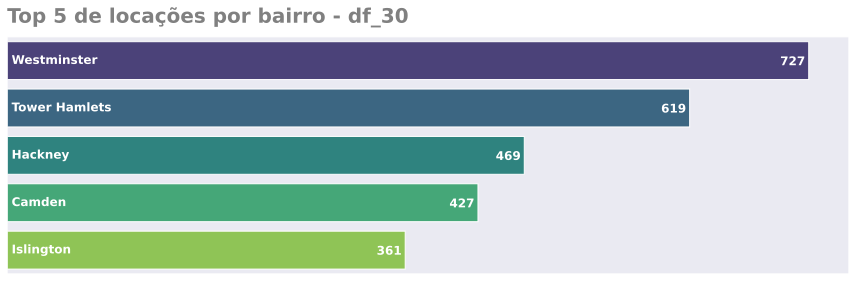

In [26]:
# Exibindo a "quantidade" de imóveis locados por bairro:

imoveis = df_30.groupby(["neighbourhood"]).size().sort_values(ascending = False)[:5]
imoveis = pd.DataFrame(imoveis, columns = ["values"])
imoveis.reset_index(inplace = True)

fig, ax = plt.subplots(figsize=(12, 4), dpi = 150)
sns.set_style()

palette = "viridis"

barras = sns.barplot(x = "values", y = "neighbourhood", data = imoveis, ax = ax, palette=palette,
                     hue = "neighbourhood", legend = False)

for i in barras.patches:
    ax.annotate(int(i.get_width()),
                xy = ((i.get_width() - (i.get_height() * 4)),
                       i.get_x() + i.get_y() + (i.get_height() / 2)),
                       va = "center_baseline", color = "white", fontweight = "bold",
                       ha = "right", fontsize = 12)

for i in range(len(imoveis)):
    bairro = imoveis.iloc[i, 0]
    valor = imoveis.iloc[i, 1]
    ax.text(valor - valor + 4, i, bairro, fontsize = 12, fontweight = "bold", color = "white", va = "center")

plt.gca().axes.get_xaxis().set_visible(False)
plt.gca().axes.get_yaxis().set_visible(False)
ax.text(0, -0.8, "Top 5 de locações por bairro - df_30", fontsize = 20, color = "grey", fontweight = "bold")

ax.set_xlabel("")
ax.set_ylabel("")
plt.tight_layout()

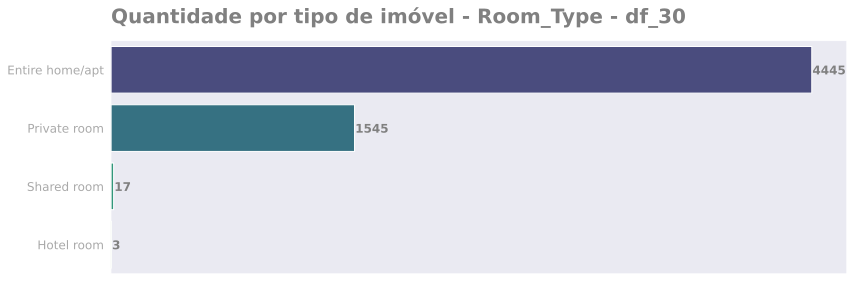

In [27]:
# Verificando a quantidade de tipo de imóvel para locação na base df_30

sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize=(12, 4), dpi = 150)

palette = "viridis"

barras = sns.countplot(y = "room_type", data = df_30, ax = ax, orient = "h", palette=palette,
                       hue = "room_type", legend = False)

for i in barras.patches:
    ax.annotate(int(i.get_width()),
                xy = (((i.get_width() + 5) - (i.get_height())),
                       i.get_x() + i.get_y() + (i.get_height() / 2)),
                       va = "center_baseline", color = "grey", fontweight = "bold",
                       ha = "left", fontsize = 12)

plt.gca().axes.get_xaxis().set_visible(False)
ax.text(0.7, -0.8, "Quantidade por tipo de imóvel - Room_Type - df_30", color = "grey", fontsize = 20, fontweight = "semibold")
ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis = "y", labelsize = 12, colors = "darkgrey")
plt.tight_layout()

A opção pela **individualidade** frente ao **compartilhamento** para quem loca o imóvel por **30 dias**, é mais de **90%** das locações.

Dentre os principais destinos de quem loca por **30 dias** a presença de bairros como **Tower Hamlets e Hackney** no top 5 indica que outros fatores como a atmosfera, a vida noturna e a proximidade de universidades, são importantes.

Enquanto **Westminster, Kensington and Chelsea** e **Camden** representam o centro mais tradicional e turístico da cidade, **Tower Hamlets** e **Hackney** são bairros mais jovens e com uma atmosfera mais vibrante, atraindo um público mais jovem e com interesses diferentes, além disso podem oferecer um bom equilíbrio entre custo e benefício, com valores de aluguel um pouco mais acessíveis e uma variedade de opções de acomodação.

A proximidade de estações de metrô e de outras opções de transporte público, é um fator importante para quem busca um local para se hospedar por um mês. A oferta de atrações turísticas, opções de lazer e vida noturna também influencia a escolha dos bairros para locações de 30 dias, como é o caso de **Camden**, conhecido por seu mercado e sua atmosfera boêmia.

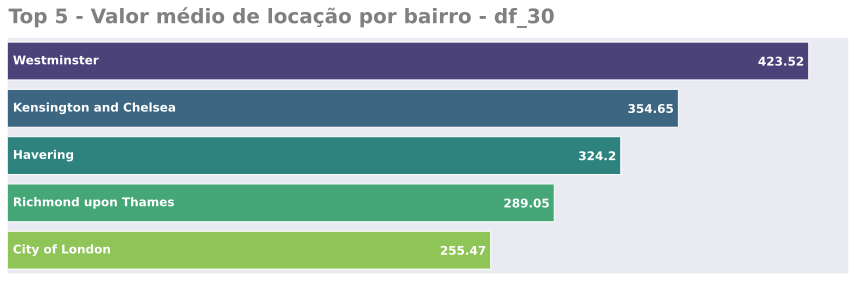

In [28]:
# Visualizando a "média" de preços por bairros ordenando pelo maior valor

price_mean = round(df_30.groupby(["neighbourhood"]).price.mean().sort_values(ascending = False)[:5], 2)
price_mean = pd.DataFrame(price_mean)
price_mean.reset_index(inplace = True)
sns.set_style("darkgrid")
fig, ax = plt.subplots(figsize=(12, 4), dpi = 150)

barras = sns.barplot(x = "price", y = "neighbourhood", data = price_mean, ax = ax, palette = "viridis",
                     hue = "neighbourhood", legend = False)

for i in barras.patches:
  ax.annotate(i.get_width(),
              xy = ((i.get_width() - (i.get_height() * 3)),
                     i.get_x() + i.get_y() + (i.get_height() / 2)),
              va = "center_baseline",
              color = "white",
              fontweight = "bold",
              ha = "right", fontsize = 12)

for i in range(len(price_mean)):
  bairro = price_mean.iloc[i, 0]
  valor = price_mean.iloc[i, 1]
  ax.text(valor - valor + 3, i, bairro, fontsize = 12, fontweight = "bold", color = "white", va = "center")

plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)
ax.text(0.7, -0.8, "Top 5 - Valor médio de locação por bairro - df_30", fontsize = 20, color = "grey", fontweight = "bold")
ax.set_xlabel("")
ax.set_ylabel("")
plt.tight_layout()

Os maiores valores médios de locação estão distribuídos por toda a cidade, sendo o de maior destaque o bairro de **Westminster** no centro.

**Conclusão:**

As **visualizações gráficas** empregadas neste estudo permitiram uma compreensão clara e intuitiva dos **padrões de locação** em **Londres**. A análise revelou uma clara relação entre os **valores médios** de aluguel, a **localização geográfica** dos bairros e as **preferências dos locatários**. Embora os resultados apresentados sejam promissores, futuras pesquisas podem explorar com mais profundidade as correlações entre variáveis como o **tamanho dos imóveis** e a **época do ano**. Além disso, uma análise mais granular dos dados, considerando fatores como a **tipologia dos imóveis** (apartamentos, casas, etc.) e as **comodidades oferecidas**, pode fornecer insights ainda mais valiosos para o mercado imobiliário londrino.

A análise revelou também a existência de **dois perfis distintos** de locatários. Um grupo busca por áreas com **vida noturna** vibrante, **cena artística** e **gastronômica diversificada**, enquanto o outro prioriza **locais históricos**, com fácil acesso a **transportes públicos** e **pontos turísticos**. A **localização geográfica** dos bairros, portanto, emerge como um fator determinante na escolha dos locatários, influenciando tanto o **valor médio** dos aluguéis quanto a **demanda** por diferentes tipos de imóveis. Apesar disso, a análise sugere a existência de um público mais heterogêneo em alguns bairros específicos, o que abre espaço para estudos mais aprofundados sobre as características desses locais e seus respectivos atrativos.
